# 13 - Limpieza de Datos: Imputación de valores faltantes.


* El siguiente notebook tiene como objetivo mostrar las diferentes tareas que se pueden realizar a la hora de tener que "limpiar" los datos de un Dataset.


<hr>


## 1.- Limpieza de datos

* Por lo general los datos que utilizan los *Analístas* o *Cientificos de Datos* suelen venir con una serie de varibles ya definidas, pero en muchas ocasiones suelen faltar valores en algunas de las variables de los elementos o estos suelen venir con formatos diversos.


* Si nos fijamos por ejemplo en las encuestas que realiza el CIS (Centor de Investigaciones Sociológicas - http://www.cis.es/), las variables de las encuestas no suelen estar completas al 100%, bien porque a los usuarios que se les realiza las encuestas no responden a todas las preguntas que se les realizar (por pudor, intimidad, privacidad, etc.) o por que al realizar las encuestas a mano pueden producirse errores humanos a la hora de escribir las respuestas o transcribirlas.


* Todo esto hace que sea necesario realizar un "Limpiado", cuyas tareas más relevantes podrian ser:
    1. Eliminar aquellos elementos que no estén informados correctamente.
    2. Eliminar aquellas variables que no estén informadas correctamente.
    3. Rellenar (o dar un valor) a aquellas variables que no estén informadas.
    
    
* Dependiendo de la naturaleza del Dataset, las labores a realizar para la "Limpieza" de los datos puede ser muy diversa, pero las 3 tareas definidas anteriormente suelen ser las comunes a realizar.


* Para realizar estas tareas necesitamos previamente realizar un estidio de la **"Calidad de los Datos"** y para ello se realizar un **Reporte del dataset** viendo entre otras cosas:
    1. Numero de elementos (observaciones) del Dataset.
    2. Numero de variables del Dataset.
    3. Número de variables desinformadas (no necesariamente valores a nulo).
    4. Número de elementos duplicados.
    5. Descripción de cada una de las variables del Dataset
        + Número de elementos distintos de la variables
        + Distribución de la variable
        + % de valores desinformados
    6. ETC.
    
    
* Como podemos ver; dependiendo del problema al que nos enfrentemos, el reporte a realizar puede ser muy diverso pero los puntos descritos anteriormente nos pueden servir como guia para saber la **"Calidad de los Datos"**.


* Por lo general suele haber librería destinadas a realizar reportes de los Datasets y con pandas en particular tenemos la librería de **"pandas_profiling"**:
(https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/)


<hr>


## 2.- Imputación de valores faltantes


* Antes de saber como realizar imputaciones de datos, debemos de saber que tipos de varibles (estadísticas) nos podemos encontrar en un Dataset, siendo estas las siguientes:


<img src="./imgs/35_01_var.png" style="width: 800px;"/>


* Dependiendo como sea el tipo de variable que este desinformada, podemos imputar los datos faltantes de una manera u otra, siendo algunas de las estrategias (entre otras) las siguientes:
<span></span><br><br>
    + ***Categoricas Nominales***: imputar la *moda* (el valor más frecuente) de los valores de la varible informada o ver la distribución de la variables e imputar un valor seleccionado de manera aleatoria o aleatoria ponderada en función de su distribución.
<span></span><br><br>
    + ***Categoricas Ordinales***: misma estrategia que las Categoricas Nominales.
<span></span><br><br>
    + ***Cuantitativas Discretas***: imputar la mediana o la moda (de la misma manera que las categoricas nominales y ordinales) de los valores de la variable que esten informadas.
<span></span><br><br>
    + ***Cuantitativas Continuas***: imputar la media de los valores de la variable que esten informadas o estudiar la distribución de la variable y sacar un número aleatorio en base a la distribución estudiada.



## 3.- Ejemplo: Estudio de la Felicidad de los Españoles.

* En el siguiente ejemplo en el que utilizaremos una de las encuestas realizadas por el CIS sobre la "**Felicidad**", vamos a realizar:
    + [3.1. Reporte del Dataset](#M1)
    + [3.2. Limpieza del Dataset e imputación de valores faltantes](#M2)
    + [3.3. Pequeño estudio (visual) sobre la Felicidad](#M3)
    

### Variables del Dataset


* Las encuestas del CIS son un conjunto de preguntas que normalmente suelen tener como respuesta a cada una de las preguntas un número finito de opciones; por ejemplo:
    1. Edad
    2. Genero
    3. ¿Situación laboral?
    4. ¿Población en la que resides?
    5. ETC.
    
    
* Las respuestas de las encuestas las podemos encontrar en formato tabular, identificando cada pregunta con un código. Ver detalle de las preguntas de la encuesta en: "*./data/Felicidad/README_FELICIDAD.md*"
    

* A continuación vamos a definir una variable identificativa a cada una de las preguntas del Dataset:

    - **A.1**: CCAA
    - **A.2**: num_poblacion
    - **A.3**: genero
    - **A.4**: edad_raw  
    - **A.9.1**: español
    - **A.9.2**: nacionalidad
    - **B.2.1**: situacion_economica
    - **B.2.2**: prediccion_situacion_economica  
    - **C.3.1**: ideologia_politica 
    - **D.1**: felicidad
    - **D.2**: religion
    - **D.3**: practicante_religion
    - **E.2** nivel_estudios
    - **E.2_2**: nivel_educativo
    - **F.1**: estado_civil
    - **F.2**: situacion_no_casados
    - **F.3**: ingresos  
    - **G.1**: situacion_laboral
    - **G.2**: prob_perder_empleo_12m
    - **G.3**: prob_encontrar_empleo_12m
    - **G.4**: situacion_profesional
    - **G.6**: situacion_socioeconomica
    - **G.12**: ingresos_hogar
    - **G.13**: ingresos_personales


<hr>


## Importamos las librerías necesarias:


In [1]:
import re
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport
from scipy import stats as st

# Propiedad de pandas para visualizar todas las columnas del DataFrame
pd.set_option('display.max_columns', None)

# Ignoramos los warnings (para pandas)
warnings.filterwarnings('ignore')

<hr>


## <a name="M1">3.1.- Reporte del Dataset</a>


* En primer lugar vamos a cargar los datos que se encuentran en "./data/Felicidad/Felicidad_DS.txt" en un DataFrame:

In [2]:
df_raw = pd.read_csv('./data/Felicidad/Felicidad_DS.txt', sep='\t', header=0, encoding = "cp1252")
df_raw.sample(5)

,AñoMes,N_Entrevista,A.1,A.2,A.3,A.4,A.9.1,A.9.2,B.2.1,B.2.2,C.3.1,D.1,D.2,D.3,E.2_2,E.2,F.1,F.2,F.3,G.1,G.2,G.3,G.4,G.6,G.12,G.13
38558,201505,308201461,Madrid (Comunidad de),Más de 1.000.000 habitantes,Mujer,75.0,Española,No procede,Regular,Igual,N.C.,10 Completamente feliz,Católico/a,Varias veces al año,Sin estudios,Menos de 5 años de escolarización,Viudo/a,No tiene pareja,La persona entrevistada,Pensionista (anteriormente no ha trabajado),N.P.,N.P.,Empresario/a o profesional con asalariados/as,Jubilados/as y pensionistas,De 601 a 900 &euro;,De 601 a 900 &euro;
25283,201412,304700575,Castilla y León,100.001 a 400.000 habitantes,Hombre,47.0,Española,No procede,Buena,Igual,10 Derecha,7,Católico/a,Casi nunca,Secundaria superior,Bachillerato,Soltero/a,No tiene pareja,La persona entrevistada,Trabaja,Nada probable,N.P.,"Asalariado/a fijo/a (a sueldo, comisión, jorna...",Obreros/as no cualificados/as,De 1.201 a 1.800 &euro;,De 1.201 a 1.800 &euro;
42740,201507,310400674,Andalucía,50.001 a 100.000 habitantes,Hombre,De 35 a 44 años {35-44},Española,No procede,Mala,Peor,N.C.,10 Completamente feliz,Católico/a,Casi nunca,Primaria y secundaria elemental,Educación primaria,Soltero/a,Tiene pareja y comparten la misma vivienda,(NO LEER) La persona entrevistada y otra casi ...,Trabaja,Poco probable,N.P.,Empresario/a o profesional con asalariados/as,Directores/as y profesionales,De 1.201 a 1.800 &euro;,De 901 a 1.200 &euro;
100901,201709,318701672,Murcia (Región de),10.001 a 50.000 habitantes,Mujer,57.0,Española,No procede,Regular,N.S.,5,7,Católico/a,Varias veces al año,F.P.,FP de grado medio,Divorciado/a,Tiene pareja y comparten la misma vivienda,(NO LEER) La persona entrevistada y otra casi ...,Trabaja,Poco probable,N.P.,"Asalariado/a fijo/a (a sueldo, comisión, jorna...",Obreros/as no cualificados/as,N.C.,N.C.
45582,201509,310901030,País Vasco,2.001 a 10.000 habitantes,Mujer,43.0,Española,No procede,Regular,N.S.,N.S.,9,No creyente,N.P.,Primaria y secundaria elemental,Educación secundaria elemental,Casado/a,N.P.,Otra persona,Trabajo doméstico no remunerado,N.P.,N.P.,"Asalariado/a fijo/a (a sueldo, comisión, jorna...",Trabajo doméstico no remunerado,N.C.,N.C.


* A continuación vamos a pasar a renombrar el nombre de las columnas a un nombre identificativo de la pregunta realizada en la encuesta.

In [3]:
df_raw.rename(columns={'A.1': 'CCAA',
                       'A.2': 'num_poblacion',
                       'A.3': 'genero',
                       'A.4': 'edad_raw',
                       'A.9.1': 'es_español',
                       'A.9.2': 'nacionalidad',
                       'B.2.1': 'situacion_economica',
                       'B.2.2': 'prediccion_situacion_economica',
                       'C.3.1': 'ideologia_politica' ,
                       'D.1': 'felicidad', 'D.2': 'religion',
                       'D.3': 'practicante_religion',
                       'E.2': 'nivel_estudios',
                       'E.2_2': 'nivel_educativo',
                       'F.1': 'estado_civil',
                       'F.2': 'situacion_no_casados',
                       'F.3': 'persona_max_ingresos',
                       'G.1': 'situacion_laboral',
                       'G.2': 'prob_perder_empleo_12m',
                       'G.3': 'prob_encontrar_empleo_12m',
                       'G.4': 'situacion_profesional',
                       'G.6': 'situacion_socioeconomica',
                       'G.12': 'ingresos_hogar',
                       'G.13': 'ingresos_personales'}, inplace=True)

df_raw.sample(5)

,AñoMes,N_Entrevista,CCAA,num_poblacion,genero,edad_raw,es_español,nacionalidad,situacion_economica,prediccion_situacion_economica,ideologia_politica,felicidad,religion,practicante_religion,nivel_educativo,nivel_estudios,estado_civil,situacion_no_casados,persona_max_ingresos,situacion_laboral,prob_perder_empleo_12m,prob_encontrar_empleo_12m,situacion_profesional,situacion_socioeconomica,ingresos_hogar,ingresos_personales
86704,201702,316802402,País Vasco,50.001 a 100.000 habitantes,Hombre,56.0,Española,No procede,Buena,Igual,6,8,Católico/a,Casi nunca,Universitarios,Licenciado,Soltero/a,No tiene pareja,Otra persona,Trabaja,Poco probable,N.P.,Profesional o trabajador/a autónomo/a (sin asa...,Pequeños/as empresarios/as,De 3.001 a 4.500 &euro;,De 1.801 a 2.400 &euro;
54240,201512,312102228,Comunitat Valenciana,400.001 a 1.000.000 habitantes,Mujer,De 35 a 44 años {35-44},Española,No procede,Regular,Igual,4,8,Católico/a,Casi nunca,Universitarios,Licenciado,Casado/a,N.P.,Otra persona,Trabaja,Poco probable,N.P.,"Asalariado/a fijo/a (a sueldo, comisión, jorna...",Técnicos/as y cuadros medios,De 1.201 a 1.800 &euro;,De 301 a 600 &euro;
2134,201401,301102135,Comunitat Valenciana,10.001 a 50.000 habitantes,Mujer,50.0,Española,No procede,Regular,Igual,5,NaN,Católico/a,Alguna vez al mes,Universitarios,Diplomado,Casado/a,N.P.,Otra persona,Trabaja,Poco probable,N.P.,"Asalariado/a eventual o interino/a (a sueldo, ...",Técnicos/as y cuadros medios,De 1.201 a 1.800 &euro;,De 301 a 600 &euro;
38803,201505,308201706,Asturias (Principado de),50.001 a 100.000 habitantes,Mujer,77.0,Española,No procede,Buena,Igual,3,7,Católico/a,Casi nunca,Sin estudios,N.P.,Viudo/a,N.C.,La persona entrevistada,Pensionista (anteriormente no ha trabajado),N.P.,N.P.,"Asalariado/a fijo/a (a sueldo, comisión, jorna...",Jubilados/as y pensionistas,N.C.,N.C.
118840,201804,321002243,Comunitat Valenciana,2.001 a 10.000 habitantes,Hombre,28.0,Española,No procede,Regular,Mejor,2,8,Ateo/a,N.P.,F.P.,FP de grado superior,Soltero/a,Tiene pareja pero no comparten la misma vivienda,La persona entrevistada,Trabaja,Poco probable,N.P.,Profesional o trabajador/a autónomo/a (sin asa...,Pequeños/as empresarios/as,De 601 a 900 &euro;,De 601 a 900 &euro;


* A continuación vamos a llamar a la librería de "*pandas_profiling*" para que nos haga un estudio del contenido del Dataset. Por legibilidad exportaremos el reporte en html.

In [4]:
# Creamos el reporte
profile = ProfileReport(df=df_raw, title='Profiling Report Felicidad', explorative=True)

# Lo exportamos a HTML
profile.to_file("./data/resultados/Reporte_Felicidad.html")

# Mostramos el reporte por pantalla
profile

<hr>


## <a name="M2">3.2.- Limpieza del Dataset e imputación de valores faltantes</a>


* A continuación se pasa a realizar las siguientes limpiezas y transformaciones tras el análisis del reporte realizado:


1. Eliminamos todos aquellos elementos que no tengan nota en el campo "*felicidad*". Dado que es un estudio de la felicidad, debemos de conocer esta nota. Tambien podríamos otorgar un valor de $-1$ a aquellas notas desconocidas de felicidad.


2. Eliminamos las variables (columnas) que tengan un alto porcentaje de desinformación, que estén altamente corelacionada con otra variable o que no sean relevantes. Estos campos serian los siguientes:
    + ***N_Entrevista***: Variable no relevante para el estudio.
    + ***nacionalidad*** Nacionalidad de la persona entrevistada (extranjeros): 97% desinformado.
    + ***nivel_estudios*** Esta información esta mejor agregada en la variable nivel_educativo.
    + ***situacion_no_casados*** Situación de convivencia de las personas no casadas: Solo aplicable al 46% del dataset.
    + ***prob_perder_empleo_12m*** Probabilidad de perder el empleo actual (próximos 12 meses): 61% desinformado.
    + ***prob_encontrar_empleo_12m*** Probabilidad de encontrar empleo (próximos 12 meses): 82% desinformado.
    + ***situacion_profesional***: Mucho nivel de detalle.


3. Pasamos la columna "*AñoMes*" a formato datetime


4. Creamos dos nuevas columnas que nos digan el mínimo y máximo número de habitantes


5. Limpiamos la columna edad y generar una edad válida en aquellos casos que no se especifique la edad de forma numérica
    * N.C: solo vienen asi dos valores. A esta valor se asignamos la edad dada por la mediana del dataset
    * Rango de edad: asignamos una edad aleatoria entre ese rango de edad
    * Mayores a 65 años: asignamos una edad aleatoria que sigue una distribución normal dada por las personas del dataset con 65 años o más.


6. Generamos una nueva variable por grupos de edad laboral
    * 18-24: edad laboral temprana
    * 25-54: edad laboral máxima
    * 55-64: edad laboral madura
    * +65: edad avanzada


7. Para la variable "*situacion_economica*" juntamos en un mismo grupo los NS, NC


8. Para la variable "*prediccion_situacion_economica*" juntamos en un mismo grupo los NS, NC


9. Para la variable "*ideologia_politica*" transformamos a variables númericas las ideologias conocidas y para las variables desconocidas les asignos un valor aleatorio siguiendo una distribución normal de media 5 y desviación 0,5.


10. Generamos una nueva variable donde discretizo la ideología política:
    * 1: extrama_izquierda
    * 2-3-4: Izquierda
    * 5-6: Centro
    * 7-8-9: Derecha
    * 10: extrema_derecha
    

11. Limpiamos la columna "*felicidad*" para ponerla como numeros enteros


12. Generamos una nueva variable en la que discretizamos la felicidad
    * muy_infeliz: 0-2
    * infeliz: 3-4
    * normal: 5-6
    * feliz: 7-8
    * muy_feliz: 9-10


13. Para la variable "*practicante_religion*" juntamos en un mismo grupo los NS, NC


14. Para la variable "*nivel_educativo*" asignamos a la categoria de "Sin estudios" aquellos valores desinformados


15. Limpiamos la variable "*persona_max_ingresos*"


16. Agrupamos la variable "*situacion_laboral*" en grupos más homogeneos
    * Estudiantes
    * Jubilados: Jubilado/a o pensionista (anteriormente ha trabajado) o Pensionista (anteriormente no ha trabajado)
    * Parados: Parado/a y busca su primer empleo o Parado/a y ha trabajado antes
    * Trabajadores: Trabaja
    * Trabajadores no remunerados: Trabajo doméstico no remunerado
    * Otros: N.C. u Otra situación


17. Creamos dos nuevas columnas que nos digan el máximo y mínimo de los ingresos del hogar


18. Creamos dos nuevas columnas que nos digan el máximo y mínimo de los ingresos personales


19. Calculamos una media de ingresos (personales y hogar) y para los que no conseguimos obtener datos, les asignamos la mediana:

    + Si bien no tiene ingresos personales pero si familiares, asignarle la media de los ingresos familiares
    + Si bien no esta informado los ingresos familiares pero si los personales, asignarle la media de los ingresos personales
     + Si se desconocen ambos ingresos, asignarle (siguiendo una distribución normal), unos ingresos aleatorios.

#### 1. Eliminamos todos aquellos elementos que no tengan nota en el campo "*felicidad*".

In [5]:
df = df_raw[df_raw['felicidad'].notna()]


#### 2. Eliminación de columnas:

+ ***N_Entrevista***: Variable no relevante para el estudio.
+ ***nacionalidad*** Nacionalidad de la persona entrevistada (extranjeros): 97% desinformado.
+ ***nivel_estudios*** Esta información esta mejor agregada en la variable nivel_educativo.
+ ***situacion_no_casados*** Situación de convivencia de las personas no casadas: Solo aplicable al 46% del dataset.
+ ***prob_perder_empleo_12m*** Probabilidad de perder el empleo actual (próximos 12 meses): 61% desinformado.
+ ***prob_encontrar_empleo_12m*** Probabilidad de encontrar empleo (próximos 12 meses): 82% desinformado.
+ ***situacion_profesional***: Mucho nivel de detalle.

In [6]:
df.drop(['N_Entrevista', 'nacionalidad', 'nivel_estudios', 'situacion_no_casados',
         'prob_perder_empleo_12m', 'prob_encontrar_empleo_12m', 'situacion_profesional'], 1, inplace=True)


#### 3. Pasar la columna "AñoMes" a formato datetime

In [7]:
df['AñoMes'] =  pd.to_datetime(df['AñoMes'], format='%Y%m')


#### 4. Creamos dos nuevas columnas que nos digan el mínimo y máximo número de habitantes

In [8]:
regex = r'\d+'

len_regex = lambda row: len(re.findall(regex,row.replace('.','')))
get_groups = lambda row: re.findall(regex,row.replace('.',''))

# Obtenemos el número mínimo de habitantes
min_habitantes = lambda row: 0 if (len_regex(row) == 1 and 'Menos' in row) else \
                            (get_groups(row)[0] if len_regex(row) == 2 else get_groups(row)[0])

# Obtenemos el número máximo de habitantes
max_habitantes = lambda row: get_groups(row)[0] if (len_regex(row) == 1 and 'Menos' in row) else \
                            (get_groups(row)[1] if len_regex(row) == 2 else 6000000)

# Creamos las nuevas columnas
df['min_habitantes'] = df['num_poblacion'].apply(lambda row: min_habitantes(row))
df['max_habitantes'] = df['num_poblacion'].apply(lambda row: max_habitantes(row))


#### 5. Limpiamos la columna edad y generar una edad válida en aquellos casos que no se especifique la edad de forma numérica

In [9]:
# 1. obtenemos la mediana de la edad
median_age = df['edad_raw'].apply(pd.to_numeric, errors='coerce').median()
print("Edad media: {} Años".format(median_age))

# 2. A partir de la columna de la edad (cuando se especifique un rango), 
#    asignamos una edad aleatoria en ese rango (Funcion: range_age)
regex = r'De (\d+) a (\d+)'
range_age = lambda row: re.findall(regex, row)[0]

# 3. Calculamos una edad Random para mayores de 65 años siguiendo una distribución normal 
#    (Funcion: mean_age_retired)
df_median_age_retired = df[pd.to_numeric(df['edad_raw'], errors='coerce').notnull()]['edad_raw'].astype(float).reset_index()
df_median_age_retired = df_median_age_retired[df_median_age_retired['edad_raw'] >= 65]['edad_raw'].agg(['mean', 'std'])
print("Media de edad y desviación de los mayores de 65 años: Media -> {:0.2f} - Desviación -> {:0.2f}"
      .format(df_median_age_retired['mean'], df_median_age_retired['std']))
mean_age_retired = int(np.random.normal(df_median_age_retired['mean'], df_median_age_retired['std']))

# 4. Asignamos la edad para cada uno de los casos (Funcion: age)
age = lambda row: median_age if row == 'N.C.' else \
                 (mean_age_retired if row == "65 y más años {65 y +}" else \
                 (random.randint(int(range_age(row)[0]),int(range_age(row)[1])) if '{' in row else row))
df['edad'] = df['edad_raw'].apply(lambda row: age(row))

# 5. Pasamos todas la edades a enteros
df['edad'] = pd.to_numeric(df['edad'], errors='coerce', downcast='integer')

# 6. Borramos la columna "age_raw"
df.drop(['edad_raw'], 1, inplace=True)


Edad media: 49.0 Años
Media de edad y desviación de los mayores de 65 años: Media -> 75.11 - Desviación -> 6.62


#### 6. Generamos una nueva variable por grupos de edad laboral

In [10]:
df['grupo_edad'] = (df['edad'].apply(lambda row: '18-24' if 18 <= row <= 24 else
                                     ('25-54' if 25 <= row <= 54 else
                                      ('55-64' if 55 <= row <= 64 else '+65'))))


#### 7. Para la variable "*situacion_economica" juntamos en un mismo grupo los NS, NC

In [11]:
df['situacion_economica'] = (df['situacion_economica']
                             .apply(lambda row: 'NS/NC' if 'N.' in row else row))


#### 8. Para la variable "prediccion_situacion_economica" juntamos en un mismo grupo los NS, NC

In [12]:
df['prediccion_situacion_economica'] = (df['prediccion_situacion_economica']
                                        .apply(lambda row: 'NS/NC' if 'N.' in row else row))


#### 9. Para la variable "*ideologia_politica*" transformamos a variables númericas las ideologias conocidas y para las variables desconocidas les asignos un valor aleatorio siguiendo una distribución normal de media 5 y desviación 0,5.

In [13]:
# Calculamos el valor de la ideología para los diferentes casos
ideologia_val = lambda row: (int(np.random.normal(5, 0.5)) if 'N.' in row else
                             (1 if '1 Izquierda' in row else
                             (10 if '10 Derecha' in row else row)))

# Aplicamos el cálculo a cada fila
df['ideologia_politica'] = df['ideologia_politica'].apply(lambda row: ideologia_val(row))

# Pasamos todos los valores a enteros
df['ideologia_politica'] = pd.to_numeric(df['ideologia_politica'], errors='coerce', downcast='integer')


#### 10. Generamos una nueva variable donde discretizo la ideología política:

* 1: extrama_izquierda
* 2-3-4: Izquierda
* 5-6: Centro
* 7-8-9: Derecha
* 10: extrema_derecha

In [14]:
df['ideologia_politica_grupo'] = (df['ideologia_politica']
                                  .apply(lambda row: 'extrema_izquierda' if row == 1 else
                                         ('Izquierda' if 2 <= row <= 4 else
                                          ('Centro' if 5 <= row <= 6 else
                                           ('Derecha' if 7 <= row <= 9 else 'extrema_derecha')))))


#### 11. Limpiamos la columna "*felicidad*" para ponerla como numeros enteros

In [15]:
# 1. Limpiamos la columna Felicidad
df['felicidad'] = (df['felicidad']
                   .apply(lambda row: '0' if '0 Completamente infeliz' in row else
                          ('10' if '10 Completamente feliz' in row else row)))

# 2. Pasamos todos los valores a enteros
df['felicidad'] = pd.to_numeric(df['felicidad'], errors='coerce', downcast='integer')


#### 12. Generamos una nueva variable en la que discretizamos la felicidad
* muy_infeliz: 0-2
* infeliz: 3-4
* normal: 5-6
* feliz: 7-8
* muy_feliz: 9-10

In [16]:
df['felicidad_grupo'] = (df['felicidad']
                         .apply(lambda row: 'muy_infeliz' if 0 <= row <= 2 else
                                ('infeliz' if 3 <= row <= 4 else
                                 ('normal' if 5 <= row <= 6 else
                                  ('feliz' if 7 <= row <= 8 else 'muy_feliz')))))


#### 13. Para la variable "*practicante_religion*" juntamos en un mismo grupo los NS, NC

In [17]:
df['practicante_religion'] = df['practicante_religion'].apply(lambda row: 'N.C.' if 'N.' in row else row)


#### 14. Para la variable "*nivel_educativo*" asignamos a la categoria de "Sin estudios" aquellos valores desinformados

In [18]:
df['nivel_educativo'] = (df['nivel_educativo']
                         .apply(lambda row: 'Sin estudios'
                                if 'N.C.' in row or 'N.S.' in row or 'Otros' in row else row))


#### 15. Limpiamos la variable "*persona_max_ingresos*"

In [19]:
df['persona_max_ingresos'] = (df['persona_max_ingresos']
                              .apply(lambda row: 'Igual' if 'NO LEER' in row else
                                     ('N.C.' if '-99.0' in row else row)))


#### 16. Agrupamos la variable "*situacion_laboral*" en grupos más homogeneos

* Estudiantes
* Jubilados: Jubilado/a o pensionista (anteriormente ha trabajado) o Pensionista (anteriormente no ha trabajado)
* Parados: Parado/a y busca su primer empleo o Parado/a y ha trabajado antes
* Trabajadores: Trabaja
* Trabajadores no remunerados: Trabajo doméstico no remunerado
* Otros: N.C. u Otra situación

In [20]:
df['situacion_laboral'] = (df['situacion_laboral']
                           .apply(lambda row: 'Jubilados' if 'pensionista' in row.lower() else
                                  ('Parados' if 'Parado' in row else
                                   ('Trabajadores' if 'Trabaja' in row else
                                    ('Trabajadores no remunerados' if 'no remunerado' in row else
                                     ('Otros' if 'N.C.' in row or 'Otra' in row else row))))))


#### 17. Creamos dos nuevas columnas que nos digan el máximo y mínimo de los ingresos del hogar

In [21]:
regex = r'\d+'
len_regex = lambda row: len(re.findall(regex,row.replace('.','')))
get_groups = lambda row: re.findall(regex,row.replace('.',''))

# Obtenemos el número mínimo
min_ingresos = (lambda row: 0 if (len_regex(row) == 1 and 'Menos' in row) else
                (get_groups(row)[0] if len_regex(row) == 1 and 'Más' in row else
                 (get_groups(row)[0] if len_regex(row) == 2 else
                  (0 if 'ingresos' in row else -1))))

# Obtenemos el número máximo. En caso de no tener se le asigna 12K
max_ingresos = (lambda row: get_groups(row)[0] if (len_regex(row) == 1 and 'Menos' in row) else
                (12000 if len_regex(row) == 1 and 'Más' in row else
                 (get_groups(row)[1] if len_regex(row) == 2 else
                  (0 if 'ingresos' in row else -1))))

# Creamos las nuevas columnas
df['min_ingresos_hogar'] = df['ingresos_hogar'].apply(lambda row: min_ingresos(row))
df['max_ingresos_hogar'] = df['ingresos_hogar'].apply(lambda row: max_ingresos(row))


#### 18. Creamos dos nuevas columnas que nos digan el máximo y mínimo de los ingresos personales

In [22]:
# Creamos las nuevas columnas
df['min_ingresos_personales'] = df['ingresos_personales'].apply(lambda row: min_ingresos(row))
df['max_ingresos_personales'] = df['ingresos_personales'].apply(lambda row: max_ingresos(row))


#### 19. Calculamos una media de ingresos (personales y hogar) y para los que no conseguimos obtener datos, les asignamos la mediana.

+ Si bien no tiene ingresos personales pero si familiares, asignarle la media de los ingresos familiares
+ Si bien no esta informado los ingresos familiares pero si los personales, asignarle la media de los ingresos personales
+ Si se desconocen ambos ingresos, asignarle (siguiendo una distribución normal), unos ingresos aleatorios.

In [23]:
# Obtenemos la media del rango máximo de ingresos ya sean personales o familiares
df['persona_max_ingresos'] = (df
                              .apply(lambda x: (max(int(x['min_ingresos_hogar']), int(x['min_ingresos_personales'])) +
                                                max(int(x['max_ingresos_hogar']), int(x['max_ingresos_personales']))) / 2,
                                     axis=1))

# Para todos aquellos de los que se desconocen sus ingresos se le asignan unos ingresos dados 
# por una distribución normal excluyendo el cero
df_ingresos_stats = df[df['persona_max_ingresos'] > 0]['persona_max_ingresos'].agg(['mean', 'std'])
mean = df_ingresos_stats['mean']
std = df_ingresos_stats['std']
print("Media de ingresos y desviación: : Media -> {:0.2f} - Desviación -> {:0.2f}".format(mean, std))

# Asignamos un valor de ingresos a los desconocidos
df['ingresos'] = (df['persona_max_ingresos']
                  .apply(lambda row: int(st.truncnorm.rvs((150-mean)/std,
                                                          (12000-mean)/std,
                                                          loc=mean,
                                                          scale=std)) 
                         if '-1' in str(row) else row))


Media de ingresos y desviación: : Media -> 1560.91 - Desviación -> 1110.97


* Una vez que tenemos el DataFrame "limpio", vamos a seleccionar las variables que nos pueden interesar:

In [24]:
df = df [['AñoMes', 'felicidad', 'felicidad_grupo', 'genero', 
         'edad', 'grupo_edad', 'estado_civil', 'nivel_educativo', 
         'ideologia_politica', 'ideologia_politica_grupo', 'religion', 'practicante_religion', 
         'situacion_laboral', 'situacion_socioeconomica', 'situacion_economica', 'prediccion_situacion_economica', 
         'persona_max_ingresos', 'ingresos_hogar', 'ingresos_personales', 'min_ingresos_hogar', 
         'max_ingresos_hogar', 'min_ingresos_personales', 'max_ingresos_personales', 'ingresos', 
         'es_español', 'CCAA', 'num_poblacion', 'min_habitantes', 'max_habitantes']]

df.sample(10)

,AñoMes,felicidad,felicidad_grupo,genero,edad,grupo_edad,estado_civil,nivel_educativo,ideologia_politica,ideologia_politica_grupo,religion,practicante_religion,situacion_laboral,situacion_socioeconomica,situacion_economica,prediccion_situacion_economica,persona_max_ingresos,ingresos_hogar,ingresos_personales,min_ingresos_hogar,max_ingresos_hogar,min_ingresos_personales,max_ingresos_personales,ingresos,es_español,CCAA,num_poblacion,min_habitantes,max_habitantes
78074,2016-11-01,7.0,feliz,Hombre,52,25-54,Soltero/a,Secundaria superior,3,Izquierda,Católico/a,Casi todos los domingos y festivos,Trabajadores,Pequeños/as empresarios/as,Buena,Igual,1500.5,De 1.201 a 1.800 &euro;,De 901 a 1.200 &euro;,1201,1800,901,1200,1500.5,Española,Cataluña,2.001 a 10.000 habitantes,2001,10000
74370,2016-10-01,NaN,muy_feliz,Mujer,52,25-54,Casado/a,F.P.,5,Centro,Católico/a,Casi nunca,Trabajadores,Directores/as y profesionales,Buena,Igual,-1.0,N.S.,N.C.,-1,-1,-1,-1,1715.0,Española,País Vasco,2.001 a 10.000 habitantes,2001,10000
111093,2018-01-01,7.0,feliz,Hombre,29,25-54,Soltero/a,Universitarios,6,Centro,Católico/a,Casi nunca,Parados,Parados/as,Mala,Mejor,0.0,N.S.,No tiene ingresos de ningún tipo,-1,-1,0,0,0.0,Española,Castilla y León,100.001 a 400.000 habitantes,100001,400000
99751,2017-09-01,10.0,muy_feliz,Mujer,47,25-54,Separado/a,F.P.,4,Izquierda,Católico/a,Casi nunca,Trabajadores,Pequeños/as empresarios/as,Regular,Igual,-1.0,N.C.,N.C.,-1,-1,-1,-1,2689.0,Española,Cataluña,Más de 1.000.000 habitantes,1000000,6000000
123241,2018-06-01,4.0,infeliz,Mujer,37,25-54,Separado/a,F.P.,3,Izquierda,Creyente de otra religión,Varias veces a la semana,Parados,Parados/as,Muy mala,Peor,750.5,De 601 a 900 &euro;,De 601 a 900 &euro;,601,900,601,900,750.5,Española,Navarra (Comunidad Foral de),2.001 a 10.000 habitantes,2001,10000
15650,2014-07-01,6.0,normal,Hombre,84,+65,Casado/a,Primaria y secundaria elemental,3,Izquierda,Católico/a,Varias veces al año,Jubilados,Jubilados/as y pensionistas,Mala,Igual,1500.5,De 1.201 a 1.800 &euro;,De 1.201 a 1.800 &euro;,1201,1800,1201,1800,1500.5,Española,Galicia,2.001 a 10.000 habitantes,2001,10000
16566,2014-07-01,1.0,muy_infeliz,Mujer,41,25-54,Soltero/a,F.P.,1,extrema_izquierda,Creyente de otra religión,Casi nunca,Trabajadores,Empleados/as de oficinas y servicios,Muy mala,Igual,750.5,De 601 a 900 &euro;,De 601 a 900 &euro;,601,900,601,900,750.5,Española,Canarias,100.001 a 400.000 habitantes,100001,400000
65140,2016-05-01,5.0,normal,Mujer,53,25-54,Casado/a,Primaria y secundaria elemental,4,Izquierda,Católico/a,Casi nunca,Trabajadores no remunerados,Trabajo doméstico no remunerado,Regular,Peor,-1.0,N.C.,N.C.,-1,-1,-1,-1,3261.0,Española,Andalucía,50.001 a 100.000 habitantes,50001,100000
22434,2014-11-01,7.0,feliz,Mujer,36,25-54,Casado/a,Universitarios,5,Centro,Católico/a,Alguna vez al mes,Trabajadores,Técnicos/as y cuadros medios,Regular,Mejor,2700.5,De 2.401 a 3.000 &euro;,De 1.201 a 1.800 &euro;,2401,3000,1201,1800,2700.5,Española,Extremadura,100.001 a 400.000 habitantes,100001,400000
62292,2016-04-01,8.0,feliz,Mujer,36,25-54,Casado/a,Universitarios,3,Izquierda,No creyente,N.C.,Parados,Parados/as,Buena,Mejor,3750.5,De 3.001 a 4.500 &euro;,No tiene ingresos de ningún tipo,3001,4500,0,0,3750.5,Española,Aragón,400.001 a 1.000.000 habitantes,400001,1000000


### Reporte del Dataset "Limpio"


* Con el dataset ya limpio y transformado, vamos a pasar a realizar un nuevo reporte para ver como ha quedado:

In [25]:
# Creamos el reporte con los datos limpios
profile = ProfileReport(df=df, title='Profiling Report Felicidad Limpio', explorative=True)

# Lo exportamos a HTML
profile.to_file("./data/resultados/Reporte_Felicidad_Limpio.html")

# Mostramos el reporte por pantalla
profile

<hr>


## <a name="M3">3.3.- Pequeño estudio (visual) sobre la Felicidad</a>


* Con el Dataset ya limpio podemos realizar todos los estudios que queramos para sacar conclusiones sobre la Felicidad. Dado que no es el objetivo principal de este notebook el de realizar un estudio sobre la felicidad, vamos a pasar a mostrar con algunos gráficos algunas conclusiones relacionadas con las encuestas de la felicidad:

### Distribución de la felicidad por nota

Text(0, 0.5, 'Count')

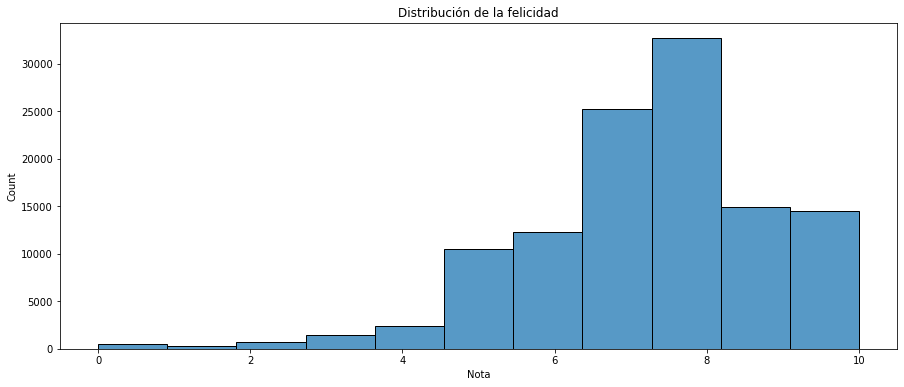

In [26]:
fig, ax = plt.subplots(figsize=(15,6))
sns.histplot(data=df, x='felicidad', bins=11)
plt.title('Distribución de la felicidad')
plt.xlabel('Nota')
plt.ylabel('Count')

### Distribución de la felicidad por grupos de felicidad

Text(0, 0.5, 'Count')

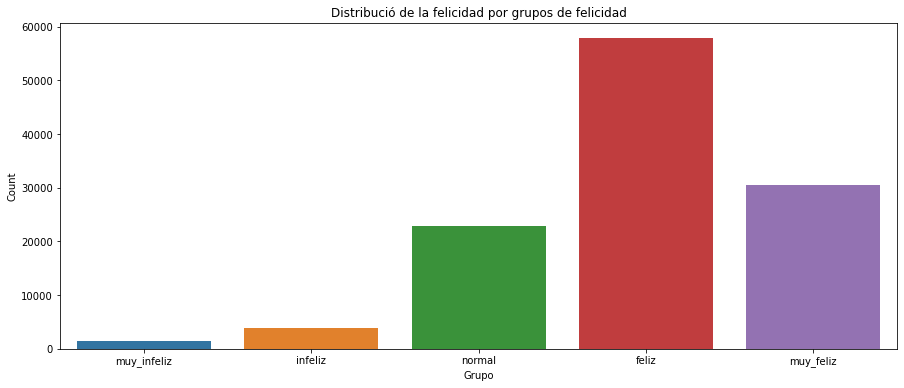

In [27]:
df_aux = df.groupby(['felicidad_grupo'])['felicidad_grupo'].agg(['count']).reset_index()
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="felicidad_grupo", y="count", data=df_aux,
            order=['muy_infeliz', 'infeliz', 'normal', 'feliz', 'muy_feliz'])
plt.title('Distribució de la felicidad por grupos de felicidad')
plt.xlabel('Grupo')
plt.ylabel('Count')


### Evolución temporal de la felicidad

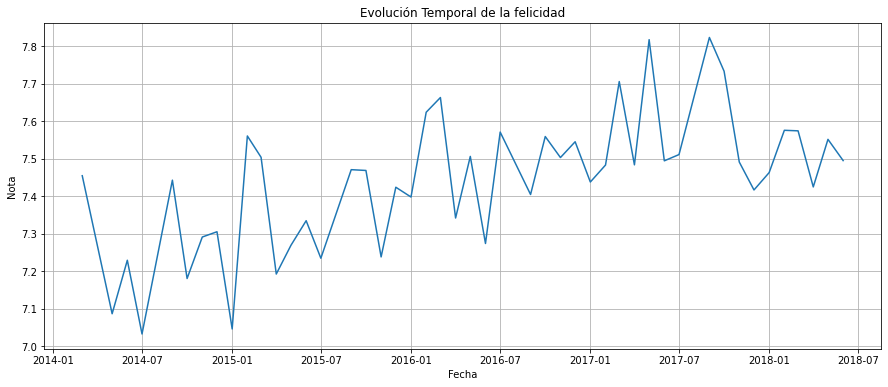

In [28]:
fig, ax = plt.subplots(figsize=(15,6))
sns.lineplot(x="AñoMes", y="felicidad", data=df)
plt.title('Evolución Temporal de la felicidad')
plt.xlabel('Fecha')
plt.ylabel('Nota')
plt.grid()


### Evolución temporal de la felicidad por genero

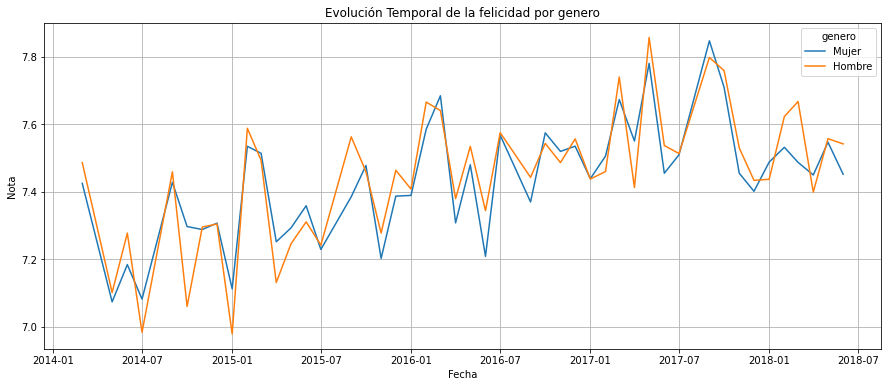

In [29]:
fig, ax = plt.subplots(figsize=(15,6))
sns.lineplot(x="AñoMes", y="felicidad", hue='genero', data=df)
plt.title('Evolución Temporal de la felicidad por genero')
plt.xlabel('Fecha')
plt.ylabel('Nota')
plt.grid()

### Distribución de felicidad por genero 

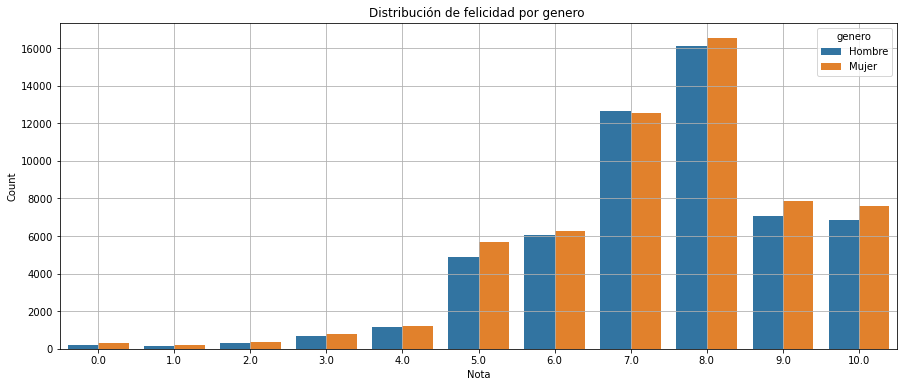

In [30]:
df_aux = df.groupby(['felicidad', 'genero'])['felicidad'].agg(['count']).reset_index()
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="felicidad", y='count', hue="genero", data=df_aux)
plt.title('Distribución de felicidad por genero ')
plt.xlabel('Nota')
plt.ylabel('Count')
plt.grid()


### Representación de felicidad por ideología política

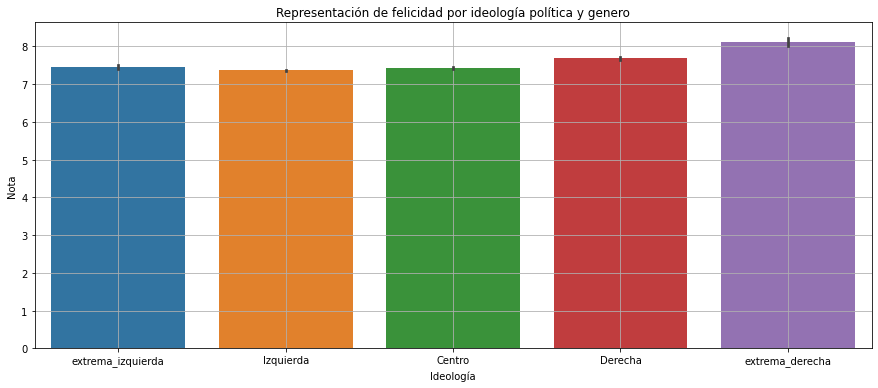

In [31]:
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="ideologia_politica_grupo", y="felicidad", data=df,
            order=['extrema_izquierda', 'Izquierda', 'Centro', 'Derecha', 'extrema_derecha'])
plt.title('Representación de felicidad por ideología política y genero')
plt.xlabel('Ideología')
plt.ylabel('Nota')
plt.grid()


### Representación de felicidad por ideología política y genero

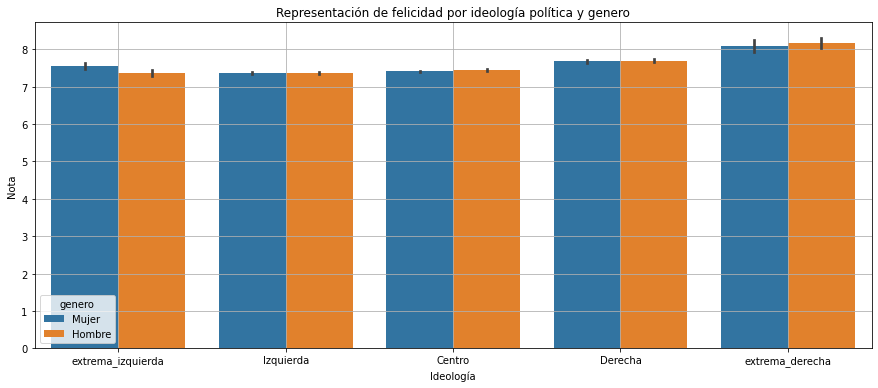

In [32]:
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="ideologia_politica_grupo", y="felicidad", hue="genero", data=df,
            order=['extrema_izquierda', 'Izquierda', 'Centro', 'Derecha', 'extrema_derecha'])
plt.title('Representación de felicidad por ideología política y genero')
plt.xlabel('Ideología')
plt.ylabel('Nota')
plt.grid()


###  Representación de felicidad por creencia religiosa

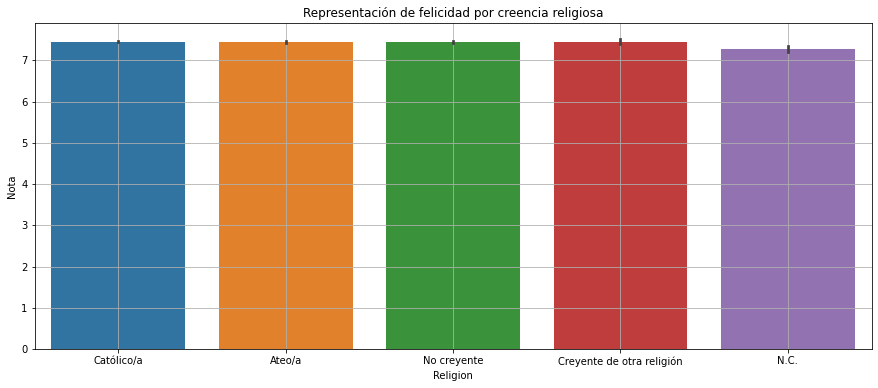

In [33]:
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="religion", y="felicidad", data=df)
plt.title('Representación de felicidad por creencia religiosa')
plt.xlabel('Religion')
plt.ylabel('Nota')
plt.grid()


### Representación de felicidad por estado civil

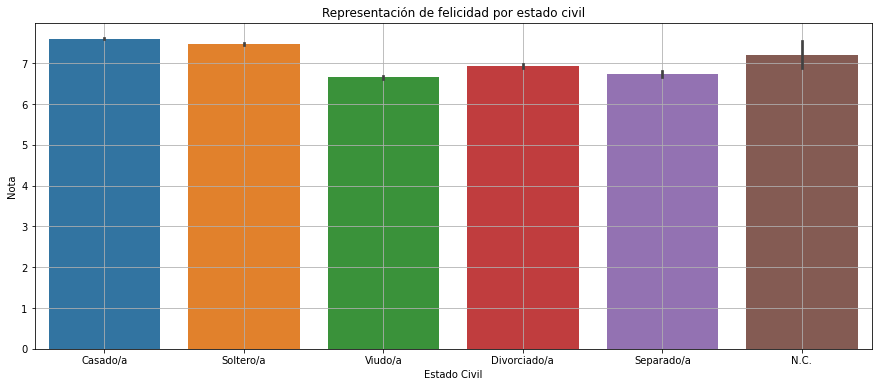

In [34]:
fig, ax = plt.subplots(figsize=(15,6))
sns.barplot(x="estado_civil", y="felicidad", data=df)
plt.title('Representación de felicidad por estado civil')
plt.xlabel('Estado Civil')
plt.ylabel('Nota')
plt.grid()


### Representación de felicidad por situación laboral

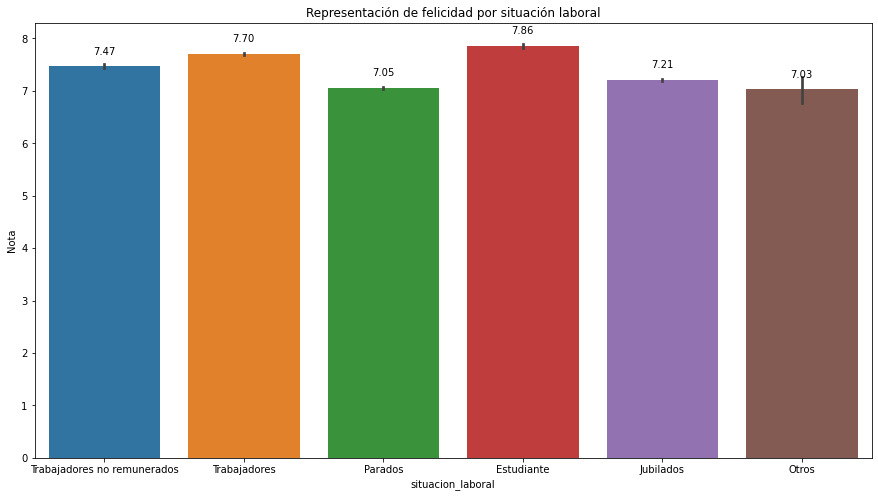

In [35]:
fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.barplot(x="situacion_laboral", y="felicidad", data=df)
plt.title('Representación de felicidad por situación laboral')
plt.xlabel('situacion_laboral')
plt.ylabel('Nota')

# Representamos la nota en la gráfica
for p in ax.patches:
    ax.annotate("%.2f" % p.get_height(), 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', 
                va='center', 
                rotation=0, 
                xytext=(0, 15), 
                textcoords='offset points')

<hr>

*Este Notebook ha sido desarrollado por **Ricardo Moya García** y registrado en Safe Creative como ***Atribución-NoComercial-CompartirIgual***.*

<img src="./imgs/CC_BY-NC-SA.png" alt="CC BY-NC">